# Clog Loss: Advance Alzheimer’s Research with Stall Catchers

https://www.drivendata.org/competitions/65/clog-loss-alzheimers-research/page/217/

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np
import pandas as pd
import cv2 
from sklearn.model_selection import train_test_split
from sklearn.metrics import matthews_corrcoef

from IPython.lib.display import YouTubeVideo

import tensorflow as tf
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (15, 10)

from clog_utils import *

AUTOTUNE = tf.data.experimental.AUTOTUNE

np.set_printoptions(precision=3, suppress=True)

tf.__version__

'2.2.0'

### Constants

In [2]:
DATASET_PATH = '/home/user/percepto/datasets/ClogLoss'

### Train Data

In [3]:
train_labels_df = pd.read_csv(f'{DATASET_PATH}/train_labels.csv')
train_labels_df

,filename,stalled
0,100000.mp4,0
1,100001.mp4,0
2,100002.mp4,0
3,100003.mp4,0
4,100004.mp4,0
...,...,...
573043,687207.mp4,0
573044,687208.mp4,0
573045,687209.mp4,0
573046,687210.mp4,0


In [4]:
train_stalled_df = train_labels_df[train_labels_df['stalled'] > 0]
train_stalled_df

,filename,stalled
107,100109.mp4,1
280,100289.mp4,1
1270,101309.mp4,1
1595,101646.mp4,1
2168,102230.mp4,1
...,...,...
570644,684752.mp4,1
570700,684812.mp4,1
571319,685443.mp4,1
572239,686385.mp4,1


In [5]:
train_metadata_df = pd.read_csv(f'{DATASET_PATH}/train_metadata.csv')
train_metadata_df

,filename,url,project_id,num_frames,crowd_score,tier1,micro,nano
0,100000.mp4,s3://drivendata-competition-clog-loss/train/10...,M,54,0.000000,True,False,False
1,100001.mp4,s3://drivendata-competition-clog-loss/train/10...,F,48,0.022769,False,False,False
2,100002.mp4,s3://drivendata-competition-clog-loss/train/10...,H,122,0.000000,True,False,False
3,100003.mp4,s3://drivendata-competition-clog-loss/train/10...,E,55,0.000000,True,False,False
4,100004.mp4,s3://drivendata-competition-clog-loss/train/10...,C,56,0.000000,True,False,False
...,...,...,...,...,...,...,...,...
573043,687207.mp4,s3://drivendata-competition-clog-loss/train/68...,G,93,0.000000,True,False,False
573044,687208.mp4,s3://drivendata-competition-clog-loss/train/68...,A,60,0.000000,True,False,False
573045,687209.mp4,s3://drivendata-competition-clog-loss/train/68...,E,49,0.000000,True,False,False
573046,687210.mp4,s3://drivendata-competition-clog-loss/train/68...,D,42,0.151080,False,False,False


### Test Data

In [6]:
test_metadata_df = pd.read_csv(f'{DATASET_PATH}/test_metadata.csv')
test_metadata_df

,filename,url,num_frames
0,100032.mp4,s3://drivendata-competition-clog-loss/test/100...,37
1,100037.mp4,s3://drivendata-competition-clog-loss/test/100...,49
2,100139.mp4,s3://drivendata-competition-clog-loss/test/100...,53
3,100182.mp4,s3://drivendata-competition-clog-loss/test/100...,51
4,100214.mp4,s3://drivendata-competition-clog-loss/test/100...,48
...,...,...,...
14155,686818.mp4,s3://drivendata-competition-clog-loss/test/686...,78
14156,686855.mp4,s3://drivendata-competition-clog-loss/test/686...,59
14157,686906.mp4,s3://drivendata-competition-clog-loss/test/686...,62
14158,686958.mp4,s3://drivendata-competition-clog-loss/test/686...,47


#### Nano Data

In [7]:
!ls {DATASET_PATH}/nano | wc -l

1413


In [8]:
nano_df = train_metadata_df[train_metadata_df['nano'] == True]
nano_df

,filename,url,project_id,num_frames,crowd_score,tier1,micro,nano
107,100109.mp4,s3://drivendata-competition-clog-loss/train/10...,L,67,0.000000,True,True,True
280,100289.mp4,s3://drivendata-competition-clog-loss/train/10...,G,59,0.765824,True,True,True
571,100588.mp4,s3://drivendata-competition-clog-loss/train/10...,A,53,0.000000,True,True,True
730,100750.mp4,s3://drivendata-competition-clog-loss/train/10...,L,63,0.000000,True,True,True
2328,102393.mp4,s3://drivendata-competition-clog-loss/train/10...,K,66,0.000000,True,True,True
...,...,...,...,...,...,...,...,...
570156,684243.mp4,s3://drivendata-competition-clog-loss/train/68...,F,55,0.764303,True,True,True
570239,684329.mp4,s3://drivendata-competition-clog-loss/train/68...,L,52,0.000000,True,True,True
570501,684600.mp4,s3://drivendata-competition-clog-loss/train/68...,A,49,1.000000,True,True,True
570636,684744.mp4,s3://drivendata-competition-clog-loss/train/68...,G,53,0.000000,True,True,True


#### Micro Data

In [9]:
!ls {DATASET_PATH}/micro | wc -l

2400


In [10]:
micro_df = train_metadata_df[train_metadata_df['micro'] == True]
micro_df

,filename,url,project_id,num_frames,crowd_score,tier1,micro,nano
107,100109.mp4,s3://drivendata-competition-clog-loss/train/10...,L,67,0.000000,True,True,True
280,100289.mp4,s3://drivendata-competition-clog-loss/train/10...,G,59,0.765824,True,True,True
571,100588.mp4,s3://drivendata-competition-clog-loss/train/10...,A,53,0.000000,True,True,True
609,100626.mp4,s3://drivendata-competition-clog-loss/train/10...,C,57,0.000000,True,True,False
730,100750.mp4,s3://drivendata-competition-clog-loss/train/10...,L,63,0.000000,True,True,True
...,...,...,...,...,...,...,...,...
570501,684600.mp4,s3://drivendata-competition-clog-loss/train/68...,A,49,1.000000,True,True,True
570636,684744.mp4,s3://drivendata-competition-clog-loss/train/68...,G,53,0.000000,True,True,True
571469,685597.mp4,s3://drivendata-competition-clog-loss/train/68...,K,48,0.000000,True,True,True
571511,685640.mp4,s3://drivendata-competition-clog-loss/train/68...,C,58,0.000000,True,True,False


#### Validate that Nano dataset is included inside Micro

In [11]:
np.all(nano_df['filename'].isin(micro_df['filename']))

True

### Paths and Statistics

In [12]:
df, folder = nano_df, 'nano'
#df, folder = micro_df, 'micro'

In [13]:
train_df, val_df = train_test_split(df, test_size=0.3, random_state=42)

In [14]:
train_metadata_paths = DATASET_PATH+'/train/'+train_metadata_df['filename'].values
test_metadata_paths = DATASET_PATH+'/test/'+test_metadata_df['filename'].values

train_paths = DATASET_PATH+'/'+folder+'/'+train_df['filename'].values
val_paths = DATASET_PATH+'/'+folder+'/'+val_df['filename'].values

In [15]:
print(f'Train Metadata: {len(train_metadata_paths)}')
print(f'Test: {len(test_metadata_paths)}')
print(f'Trainig: train {len(train_paths)}, validation {len(val_paths)}')

Train Metadata: 573048
Test: 14160
Trainig: train 989, validation 424


### Yutube

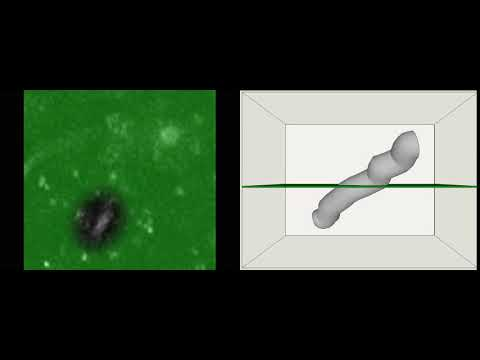

In [16]:
YouTubeVideo('-2aW6m60mYg')

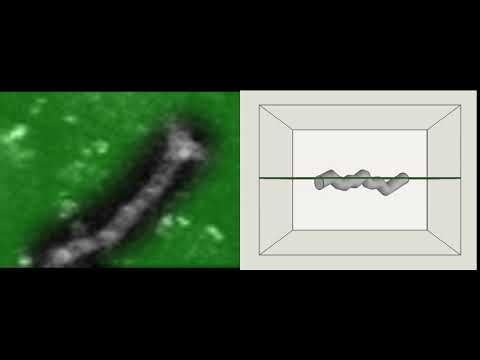

In [17]:
YouTubeVideo('c6TtoQhMrbA')

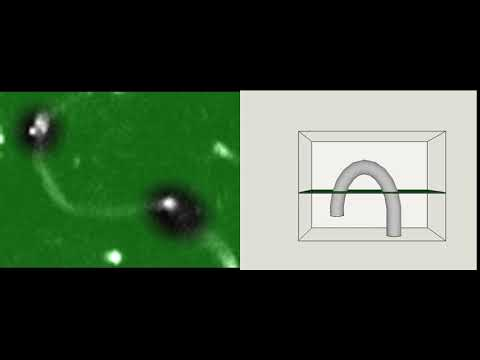

In [18]:
YouTubeVideo('_uJ_dcy-OXQ')

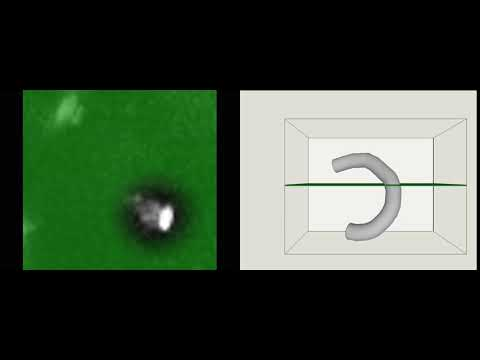

In [19]:
YouTubeVideo('9RFnguYmd_8')

### Stalled and Flowing Clips

In [20]:
stalled_df = df[df['crowd_score'] >=0.5]
stalled_paths = DATASET_PATH+'/micro/'+stalled_df['filename'].values

flowing_df = df[df['crowd_score'] < 0.5]
flowing_paths = DATASET_PATH+'/micro/'+flowing_df['filename'].values

len(stalled_paths), len(flowing_paths)

(556, 857)

### Display Flowing Clips

In [21]:
display_clip(flowing_paths[0])

/home/user/percepto/datasets/ClogLoss/micro/100109.mp4


### Display Stalled Clips

In [22]:
display_clip(stalled_paths[0])

/home/user/percepto/datasets/ClogLoss/micro/100289.mp4


### Read Clip

In [30]:
frames = read_clip(stalled_paths[100])
frames.shape

(50, 384, 512, 3)

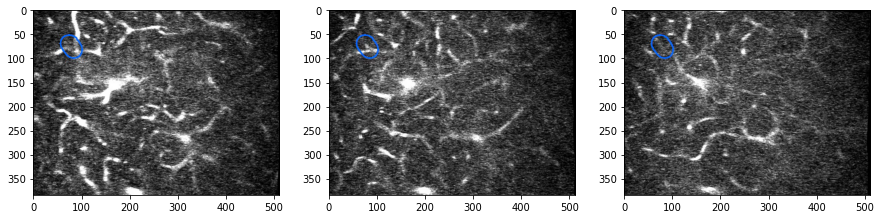

In [31]:
plt.subplot(131)
plt.imshow(frames[0])
plt.subplot(132)
plt.imshow(frames[20])
plt.subplot(133)
plt.imshow(frames[40])

### DataSet

### Evaluation

In [32]:
y_true = (val_df['crowd_score'] >= 0.5).astype(int).values
y_true

array([0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1,

In [33]:
y_pred = y_true # should be 1
#y_pred = 1-y_true # should be -1
y_pred = np.random.randint(0, 2, y_true.shape) #  should be around 0
y_pred

array([1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1,

In [27]:
matthews_corrcoef(y_true, y_pred)

-0.028997274743708574